In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,mean_absolute_percentage_error

from numpy import arange
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score


from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.model_selection import train_test_split # to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix, classification_report # to create a confusion matrix and classification report
from sklearn.metrics import ConfusionMatrixDisplay # to draw a confusion matrix
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import precision_score, recall_score # to calculate the performance metrics
from sklearn.metrics import roc_curve, roc_auc_score # to calculate the performance metrics
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
df = pd.read_csv('college_data.csv')
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


### Exploratory Data Analysis:

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

In [4]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


Numerical variables are as follows:   

- Apps: Number of applications received  
- Accept: Number of applications accepted  
- Enroll: Number of new students enrolled  
- Top10perc: Pct. new students from top 10% of H.S. class   
- Top25perc: Pct. new students from top 25% of H.S. class  
- F_Undergrad: Number of full-time undergraduates  
- P_Undergrad: Number of part-time undergraduates     
- Outstate: Out-of-state tuition      
- Room.Board: Room and board costs     
- Books: Estimated book costs     
- Personal: Estimated personal spending      
- PhD: Pct. of faculty with Ph.D.’s     
- Terminal: Pct. of faculty with terminal degree     
- S_F_Ratio: Student/faculty ratio   
- perc_alumni: Pct. alumni who donate    
- Expend: Instructional expenditure per student    
- Grad_Rate: Graduation rate (***target***) 

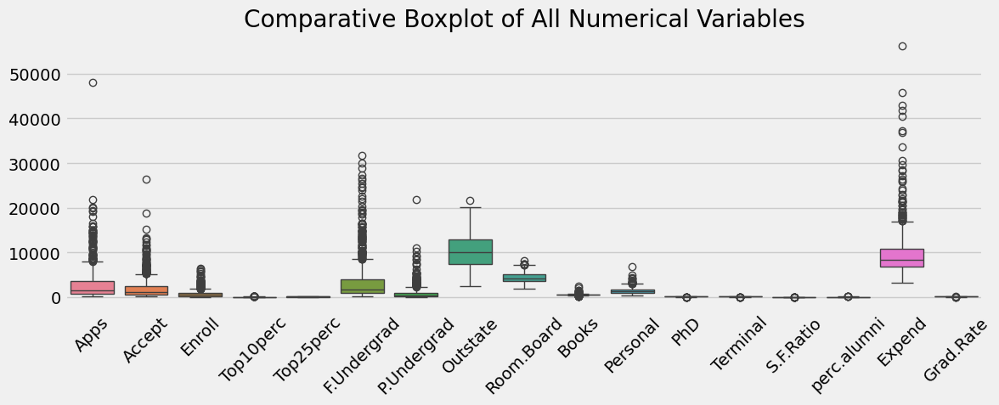

In [5]:
# comparitive boxplot of numerical variables

# create filtered df of only numerical data
num_cols_df = df.select_dtypes(include=['int64', 'float64'])

# figure and plot
plt.figure(figsize=(12, 5))
sns.boxplot(data=num_cols_df)
plt.title('Comparative Boxplot of All Numerical Variables')
plt.xticks(rotation=45) # rotate x-labels for readability
plt.tight_layout()
plt.show()

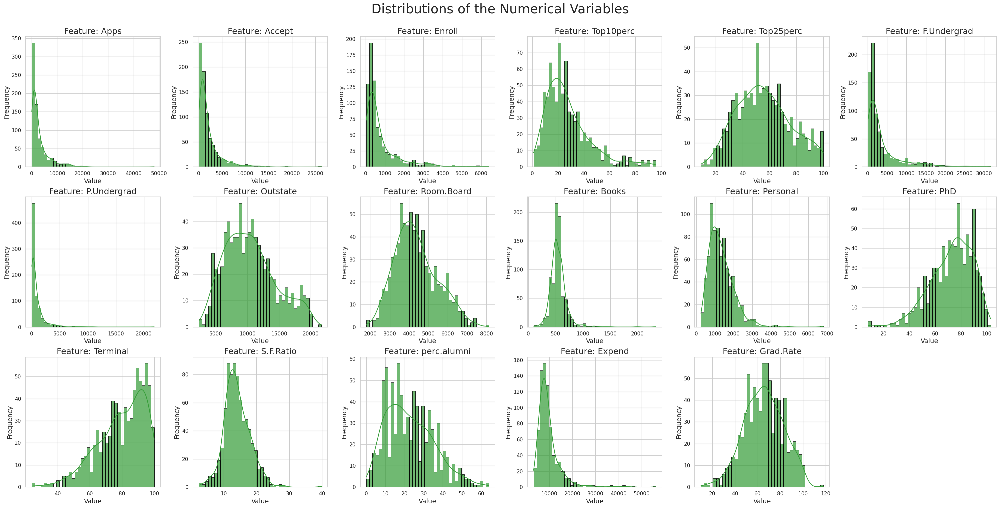

In [6]:
# Produce histograms for all numerical variables

from matplotlib import gridspec

sns.set_theme(style='whitegrid', palette='pastel')

def plot_numerical_distributions(df_copy):
    # Get only the numerical columns 
    num_cols = df_copy.select_dtypes(include=['int64', 'float64']).columns
    num_features = len(num_cols)

    # Layout calculation
    ncols = 6  # Number of columns per row 
    nrows = (num_features + ncols - 1) // ncols  # Rows needed for the columns

    # Setup figure and gridspec
    fig = plt.figure(figsize=(5 * ncols, 5 * nrows))  
    gs = gridspec.GridSpec(nrows, ncols)

    def plot_hist(data, column, ax):
        sns.histplot(data=data, x=column, ax=ax, kde=True, bins=40, alpha=0.7, edgecolor='black', color='#349C36')
        ax.set_title(f'Feature: {column}', fontsize=18)
        ax.set_xlabel('Value', fontsize=14)
        ax.set_ylabel('Frequency', fontsize=14)

    for i, col in enumerate(num_cols):
        ax = fig.add_subplot(gs[i // ncols, i % ncols])
        plot_hist(df_copy, col, ax)

    plt.suptitle("Distributions of the Numerical Variables", fontsize=28, y=1.01)
    plt.tight_layout(pad=0.6)
    plt.show()

plot_numerical_distributions(df)

In [7]:
dummies = pd.get_dummies(df['Private'], prefix="Private").astype(int)
df = pd.concat([df, dummies], axis=1)
df.drop(columns=['Private'], axis=1, inplace=True)
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0,1
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0,1
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0,1
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0,1
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0,1


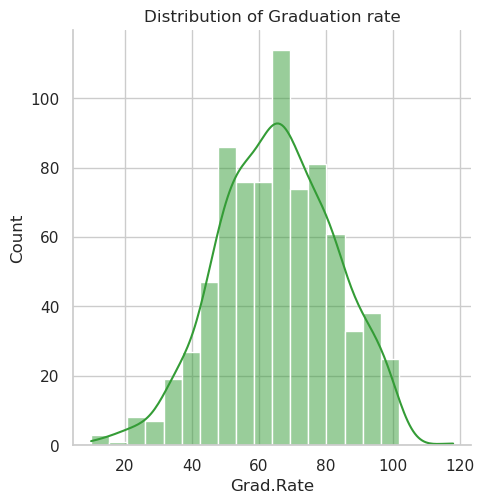

In [8]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Grad.Rate'], color='#349C36', kde=True)
plt.title('Distribution of Graduation rate')
plt.show()

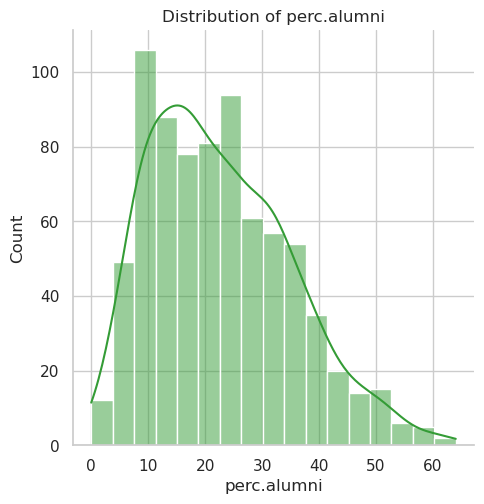

In [9]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['perc.alumni'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

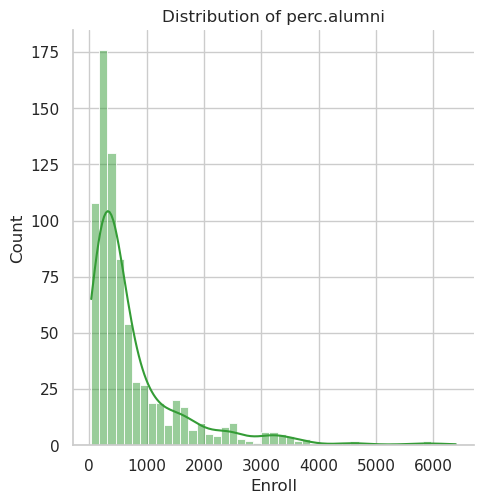

In [10]:
#Quick distribution plot 
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Enroll'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

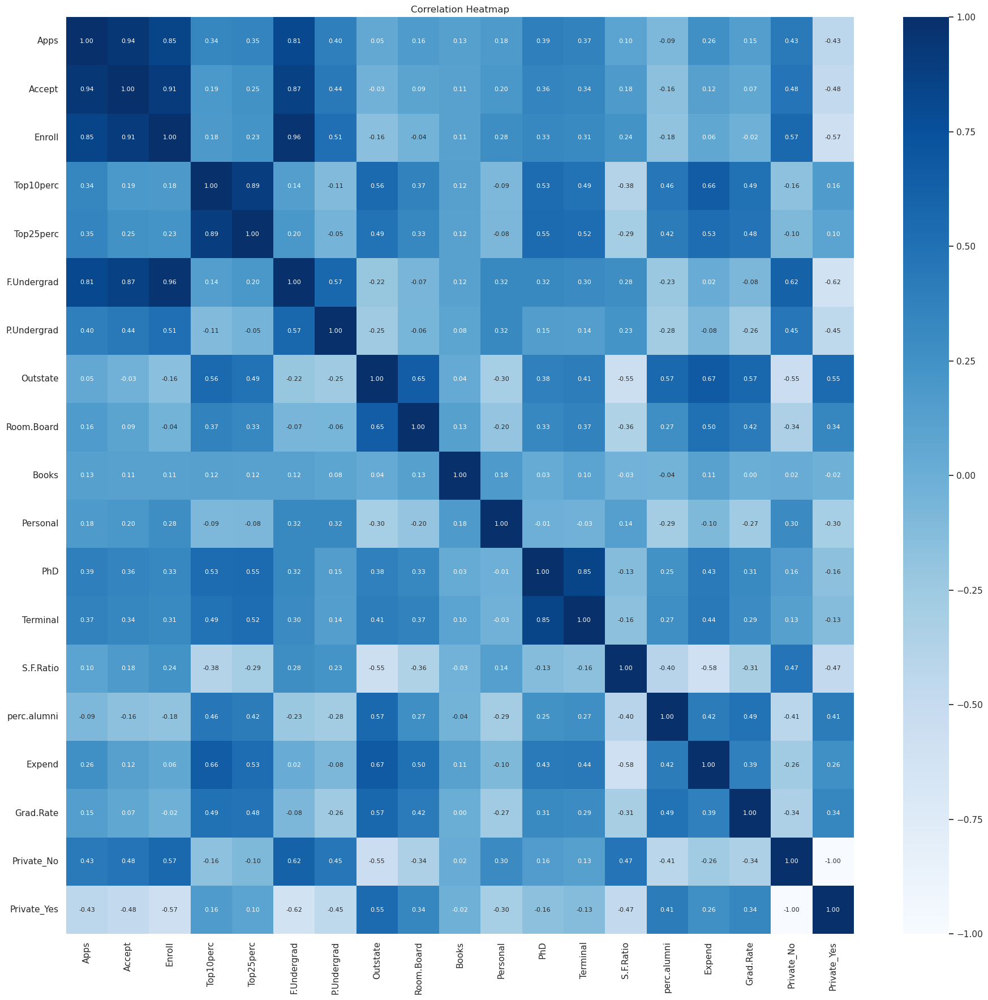

In [11]:
#Correlation Heatmap
f, ax = plt.subplots(figsize=(20, 20))
corr = df.corr()
sns.heatmap(corr, annot=True, fmt='.2f', annot_kws={'fontsize': 8}, cmap='Blues')
plt.title('Correlation Heatmap', fontsize=12)
plt.show()

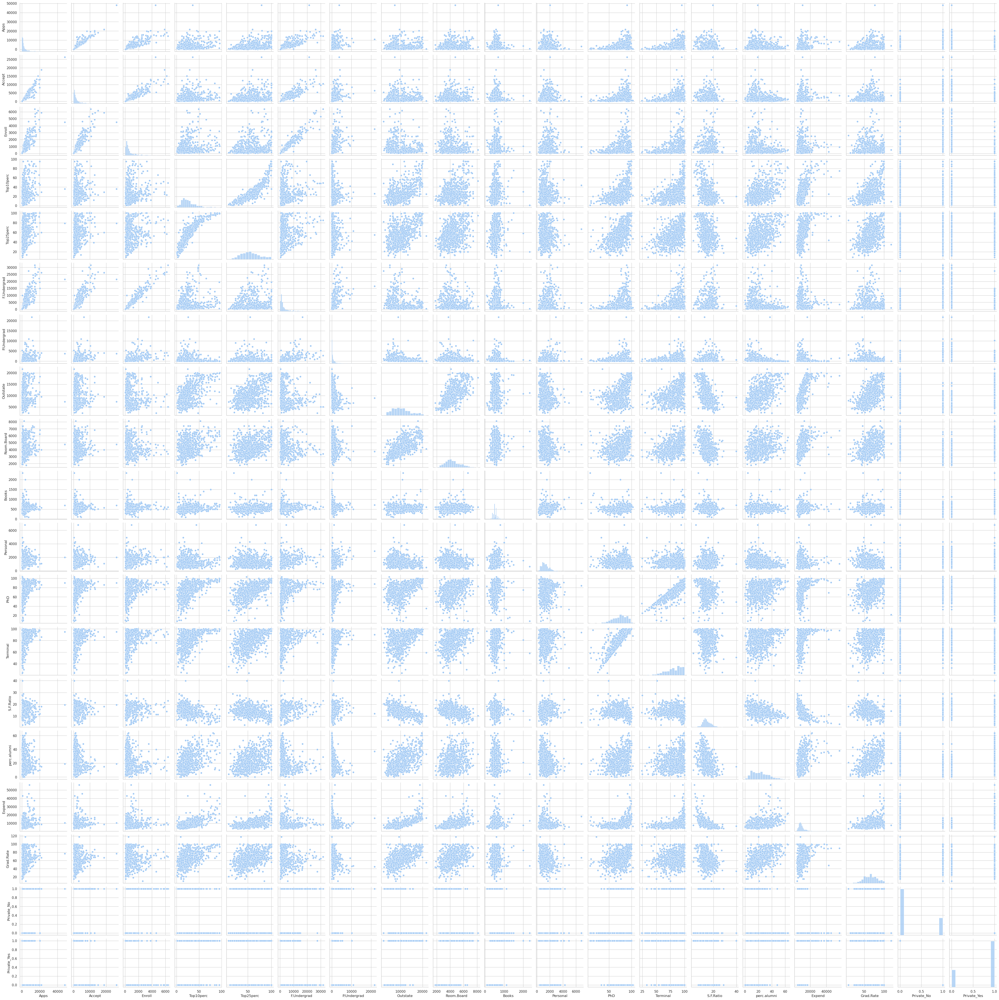

In [12]:
sns.pairplot(df)
plt.show()

In [13]:
pairwiseCorr = df.select_dtypes(include=np.number).corr()

reordered = pairwiseCorr.abs().unstack()
reordered = reordered.sort_values(ascending=True)
columns_final = [(col1, col2) for col1, col2 in reordered.index if (reordered.loc[col1].at[col2] > 0.8) and col1 != col2]
print("Pairs that have a correlation of more than 0.8 in absolute value: ")
for x in columns_final:
    print(x[0], x[1])

Pairs that have a correlation of more than 0.8 in absolute value: 
F.Undergrad Apps
Apps F.Undergrad
Enroll Apps
Apps Enroll
Terminal PhD
PhD Terminal
Accept F.Undergrad
F.Undergrad Accept
Top10perc Top25perc
Top25perc Top10perc
Enroll Accept
Accept Enroll
Accept Apps
Apps Accept
Enroll F.Undergrad
F.Undergrad Enroll
Private_No Private_Yes
Private_Yes Private_No


In [14]:
# Generating a list of all the variables with a correlation score over 0.3 (absolute)
corr = df.corr()
high_pos_corr_vars = corr['Grad.Rate'].loc[corr['Grad.Rate'] >= 0.3].index.to_list()
print(high_pos_corr_vars)
high_neg_corr_vars = corr['Grad.Rate'].loc[corr['Grad.Rate'] <= -0.3].index.to_list()
print(high_neg_corr_vars)

['Top10perc', 'Top25perc', 'Outstate', 'Room.Board', 'PhD', 'perc.alumni', 'Expend', 'Grad.Rate', 'Private_Yes']
['S.F.Ratio', 'Private_No']


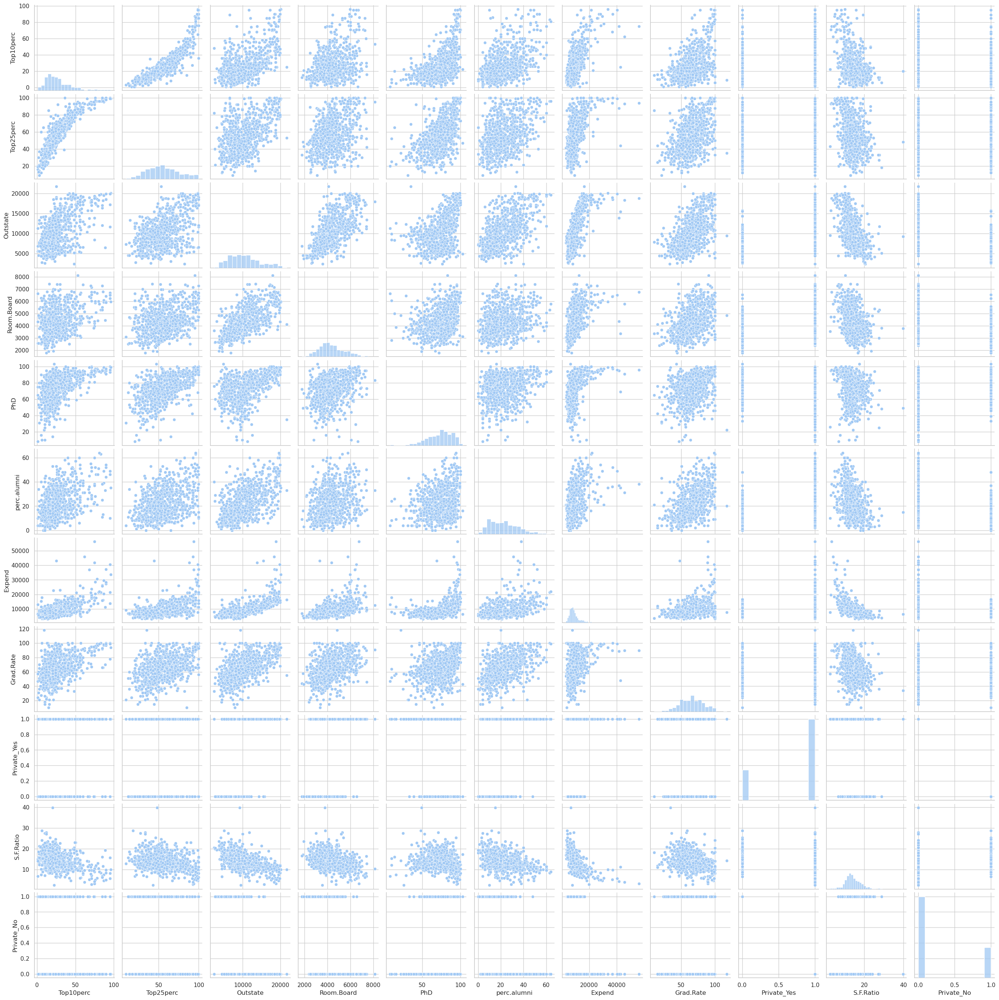

In [15]:
#pair plots for variables with high correlation
sns.set_theme(style='whitegrid', palette='pastel')
sns.pairplot(df[(high_pos_corr_vars + high_neg_corr_vars)])
plt.show()

### Make Grad.Rate categorical:

In [16]:
savedGradRate = df["Grad.Rate"]

In [17]:
print(df["Grad.Rate"].mean())
df['Grad.Rate'] = np.where( df["Grad.Rate"] > df["Grad.Rate"].mean(), 1, 0)
df["Grad.Rate"]

65.46332046332046


0      0
1      0
2      0
3      0
4      0
      ..
772    0
773    1
774    0
775    1
776    1
Name: Grad.Rate, Length: 777, dtype: int64

In [18]:
# Filter data for each class
Grad_Rate_0 = df.query("`Grad.Rate` == 0").describe() 
Grad_Rate_1 = df.query("`Grad.Rate` == 1").describe()

print("Below mean graduation rate (Grad.Rate = 0):")
display(Grad_Rate_0)
print("Above mean graduation rate (Grad.Rate = 1):")
display(Grad_Rate_1)

Below mean graduation rate (Grad.Rate = 0):


,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
count,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.0,391.000000,391.000000
mean,2548.421995,1826.017903,783.393862,20.468031,48.132992,4043.815857,1158.826087,8328.381074,3944.943734,553.795396,1506.109974,67.887468,75.401535,15.190026,17.263427,7962.588235,0.0,0.414322,0.585678
std,2974.150383,2015.229017,882.678632,11.248858,17.182511,5043.744395,1930.163230,2945.090075,935.203977,167.071101,699.889468,16.634614,15.187542,4.086805,9.921728,3196.070362,0.0,0.493236,0.493236
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,2.000000,2340.000000,1780.000000,110.000000,250.000000,8.000000,25.000000,2.500000,0.000000,3186.000000,0.0,0.000000,0.000000
25%,601.500000,494.000000,210.000000,12.000000,36.000000,891.000000,132.500000,6375.000000,3321.000000,500.000000,1000.000000,57.000000,65.000000,12.500000,10.000000,6120.500000,0.0,0.000000,0.000000
50%,1256.000000,978.000000,394.000000,19.000000,47.000000,1695.000000,474.000000,8000.000000,3776.000000,528.000000,1425.000000,71.000000,77.000000,14.700000,16.000000,7440.000000,0.0,0.000000,1.000000
75%,3356.500000,2443.000000,1027.500000,26.000000,59.500000,5481.000000,1417.500000,9970.000000,4442.000000,600.000000,1908.500000,80.000000,88.000000,17.800000,23.000000,9158.000000,0.0,1.000000,1.000000
max,19315.000000,10344.000000,5329.000000,65.000000,100.000000,30017.000000,21836.000000,21700.000000,7425.000000,2340.000000,4913.000000,103.000000,100.000000,39.800000,53.000000,42926.000000,0.0,1.000000,1.000000


Above mean graduation rate (Grad.Rate = 1):


,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
count,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.0,386.000000,386.000000
mean,3460.725389,2214.088083,776.507772,34.740933,63.559585,3351.544041,547.839378,12580.318653,4775.453368,544.909326,1173.031088,77.494819,84.059585,12.975130,28.295337,11379.743523,1.0,0.129534,0.870466
std,4561.796470,2814.192449,975.155333,19.906149,19.272558,4626.908186,842.296992,3835.891893,1090.995496,163.184843,609.767313,14.508617,12.860655,3.491028,12.181350,6222.526406,0.0,0.336225,0.336225
min,141.000000,118.000000,46.000000,3.000000,20.000000,199.000000,1.000000,3811.000000,2190.000000,96.000000,300.000000,22.000000,24.000000,2.900000,2.000000,3480.000000,1.0,0.000000,0.000000
25%,946.500000,744.250000,287.000000,20.250000,50.000000,1115.250000,69.250000,10025.000000,4001.250000,450.000000,800.000000,68.000000,77.000000,10.825000,19.000000,7781.500000,1.0,0.000000,1.000000
50%,1763.000000,1316.500000,456.000000,30.000000,63.000000,1715.000000,256.000000,12102.500000,4619.500000,500.000000,1032.500000,80.000000,88.000000,12.700000,29.000000,9522.500000,1.0,0.000000,1.000000
75%,3869.500000,2399.500000,799.750000,44.000000,78.000000,3158.000000,705.500000,15570.000000,5607.500000,600.000000,1424.250000,89.000000,94.000000,14.900000,36.000000,12998.000000,1.0,0.000000,1.000000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,9310.000000,20100.000000,8124.000000,2000.000000,6800.000000,100.000000,100.000000,27.200000,64.000000,56233.000000,1.0,1.000000,1.000000


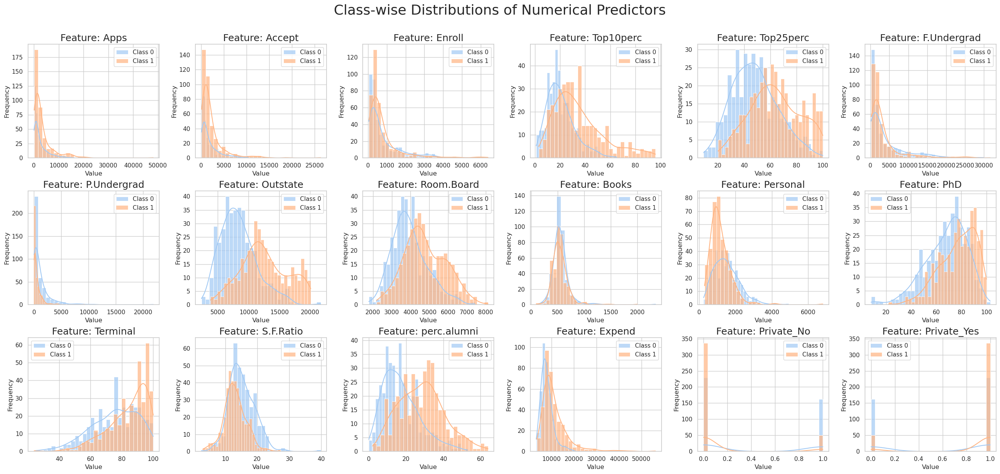

In [19]:
# Plot each numerical predictor across its classes of the response

from matplotlib import gridspec
palette = sns.set_palette('pastel')

def plot_classwise_distributions(X_df, class_column):
    # Get only the numerical columns and exclude the class column
    num_cols = X_df.select_dtypes(include=['int64', 'float64']).columns.drop(class_column)
    num_features = len(num_cols)

    # Create masks for each class for binary classes (0 and 1)
    class_masks = {cls: X_df[X_df[class_column] == cls] for cls in X_df[class_column].unique()}
    palette = sns.color_palette('pastel', n_colors=len(class_masks))

    # Layout calculations
    ncols = 6  # Number of columns per row 
    nrows = (num_features + ncols - 1) // ncols  # Rows needed for the columns
    fig = plt.figure(figsize=(26, 4 * nrows))
    gs = gridspec.GridSpec(nrows, ncols)

    def plot_hist(data, column, ax, color, label):
        sns.histplot(data=data, x=column, ax=ax, kde=True, bins=30, color=color, alpha=0.7, label=label)
        ax.legend()

    for i, col in enumerate(num_cols):
        ax = fig.add_subplot(gs[i // ncols, i % ncols])
        for cls, mask in class_masks.items():
            plot_hist(mask, col, ax, color=palette[cls], label=f'Class {cls}')
        ax.set_title(f'Feature: {col}', fontsize=18)
        ax.set_xlabel('Value', fontsize=12)
        ax.set_ylabel('Frequency', fontsize=12)

    plt.suptitle("Class-wise Distributions of Numerical Predictors", fontsize=26, y=1.02)
    plt.tight_layout(pad=0.6) 
    plt.show()

plot_classwise_distributions(df, 'Grad.Rate')

### Split and scale the data:

In [20]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [21]:
# Produce the count of both levels of Grad_Rate

print("Count of each class of the target:")
print(f"Class 0 (Below-average): {y.value_counts()[0]} (or {(y.value_counts(normalize =True)[0]*100).round(3)}%)")
print(f"Class 1 (Above-average): {y.value_counts()[1]} (or {(y.value_counts(normalize =True)[1]*100).round(3)}%)")

Count of each class of the target:
Class 0 (Below-average): 391 (or 50.322%)
Class 1 (Above-average): 386 (or 49.678%)


In [22]:
# Produce the post-split count of both levels of Grad_Rate

print("y_train:")
print(f"{y_train.value_counts()[0]} observations, or {(y_train.value_counts(normalize =True)[0]*100).round(3)}%, are in class 0")
print(f"{y_train.value_counts()[1]} observations, or {(y_train.value_counts(normalize =True)[1]*100).round(3)}%, are in class 1\n")

print("y_test:")
print(f"{y_test.value_counts()[0]} observations, or {(y_test.value_counts(normalize =True)[0]*100).round(3)}%, are in class 0")
print(f"{y_test.value_counts()[1]} observations, or {(y_test.value_counts(normalize =True)[1]*100).round(3)}%, are in class 1")

y_train:
312 observations, or 50.242%, are in class 0
309 observations, or 49.758%, are in class 1

y_test:
79 observations, or 50.641%, are in class 0
77 observations, or 49.359%, are in class 1


In [23]:
sc = StandardScaler()

In [24]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

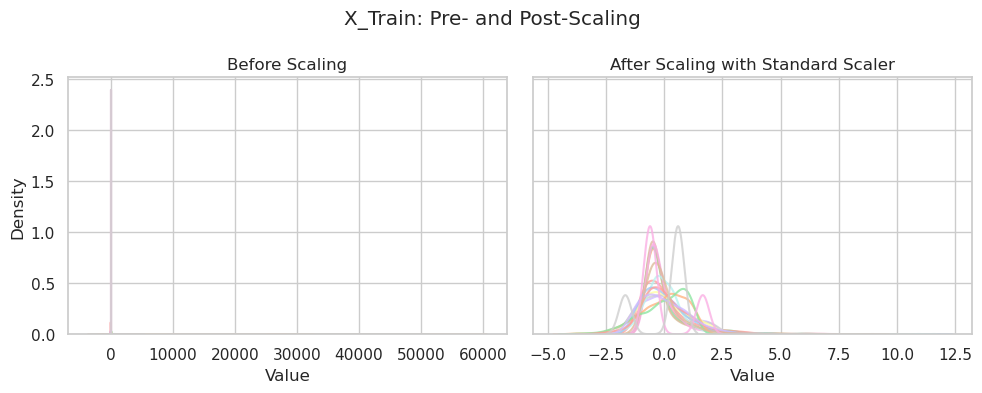

In [25]:
# View distribution of X-train before and after scaling 

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)  # sharey to compare distributions directly
titles = ['Before Scaling', 'After Scaling with Standard Scaler']
data = [X_train, X_train_sc]  # List of dfs
for ax, title, df in zip(axes, titles, data):
    ax.set_title(title)
    [sns.kdeplot(x=col, data=df, ax=ax, alpha=0.8) for col in df.columns]  # List comprehension
    ax.set_xlabel("Value")
plt.suptitle("X_Train: Pre- and Post-Scaling")
plt.tight_layout()
plt.show()

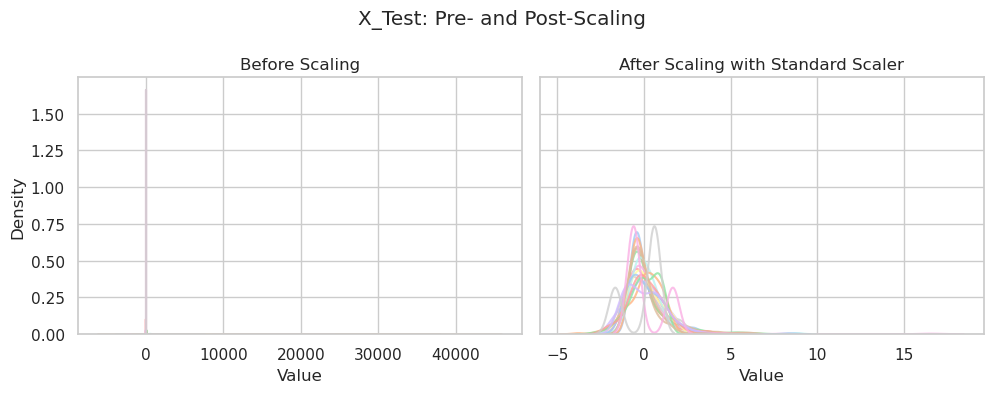

In [26]:
# View distribution of X-test before and after scaling 

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)  # sharey to compare distributions directly
titles = ['Before Scaling', 'After Scaling with Standard Scaler']
data = [X_test, X_test_sc]  # List of dfs
for ax, title, df in zip(axes, titles, data):
    ax.set_title(title)
    [sns.kdeplot(x=col, data=df, ax=ax, alpha=0.8) for col in df.columns]  # List comprehension
    ax.set_xlabel("Value")
plt.suptitle("X_Test: Pre- and Post-Scaling")
plt.tight_layout()
plt.show()

In [27]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [28]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

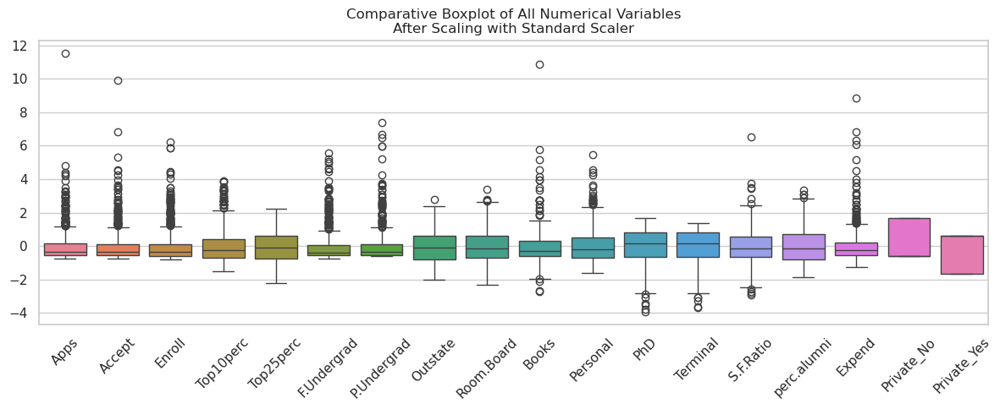

In [29]:
# comparitive boxplot of numerical variables after scaling

# create filtered df of only numerical data
num_cols_df = X_train_sc.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(12, 5))
sns.boxplot(data=num_cols_df)
plt.title('Comparative Boxplot of All Numerical Variables\nAfter Scaling with Standard Scaler')
plt.xticks(rotation=45) # rotate x-labels for readability
plt.tight_layout()
plt.show()

## Logistic Regression

In [30]:
from sklearn.linear_model import LogisticRegression

#Basic logistic regression model
logistic_initial = LogisticRegression(max_iter = 10000, random_state = 21)
logistic_initial.fit(X_train, y_train)

LogisticRegression(max_iter=10000, random_state=21)

In [31]:
# To explain importance of each predictor, first put them all in an easy to view format
#extract the coefficients of the logistic regression model and name it log_coef
log_coef = logistic_initial.coef_ 

#convert the coef to a pandas data frame
df_log_coef = pd.DataFrame(log_coef)
#print(df_log_coef)

# Change the column names to the variable names
df_log_coef.columns = X_train.columns

# Transpose the data frame for better view
df_log_coef = df_log_coef.T

# renaming the column of the cefficient to logreg_coefficient
# logreg_coeff is corresponding logistic regression coefficients of the variable
df_log_coef = df_log_coef.rename(columns = {0:'LogisticCoefficient'}) 

#arrange the coefficients in an ascending order
df_log_coef = df_log_coef.sort_values('LogisticCoefficient')

# Reset the index so there are two seperate columns
df_log_coef = df_log_coef.reset_index()

# And rename the index column we just made
df_log_coef = df_log_coef.rename(columns = {'index':'VariableName'})

df_log_coef

,VariableName,LogisticCoefficient
0,F.Undergrad,-0.975166
1,Expend,-0.376543
2,Personal,-0.218037
3,Private_No,-0.172149
4,P.Undergrad,-0.169868
5,Books,-0.167109
6,Terminal,-0.089369
7,S.F.Ratio,0.023741
8,Private_Yes,0.172149
9,Top25perc,0.193193


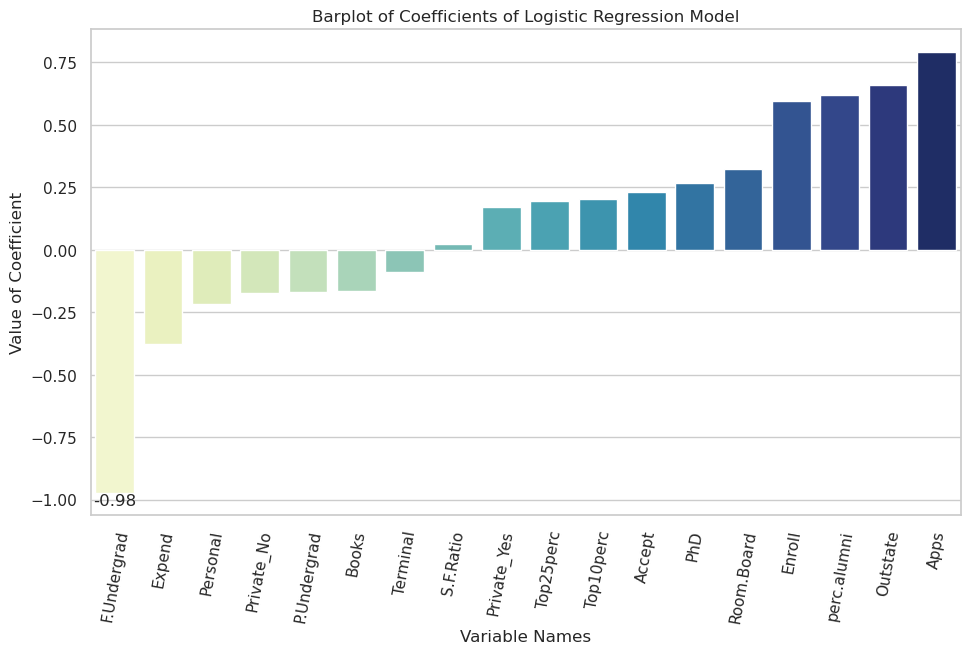

In [32]:
plt.figure(figsize=(10, 6))
plot = sns.barplot(x="VariableName",y="LogisticCoefficient",data=df_log_coef, palette ="YlGnBu")
plot.bar_label(plot.containers[0], fmt='%.2g')

plt.xticks(rotation=80)
plt.title('Barplot of Coefficients of Logistic Regression Model')
plt.xlabel('Variable Names')
plt.ylabel('Value of Coefficient')
plt.show()

In [33]:
# Import necessary module for grid search cross-validation
from sklearn.model_selection import GridSearchCV

# Define the grid of hyperparameters to search over
grid = {
    "C": [0.001, 0.01, 0.1, 0.5, 1, 2, 5, 10, 20, 30, 40, 50, 100, 200],  # Regularization parameter values
    "penalty": ["l1", "l2"],  # Penalty norm for regularization
    "class_weight": [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:5}],  # Class weight options
    "solver": ['lbfgs', 'liblinear']  # Solver options
}

# Initialize a Logistic Regression model with a specified random state for reproducibility
logreg = LogisticRegression(random_state=21)

# Initialize a GridSearchCV object with the logistic regression model, hyperparameter grid, and 10-fold cross-validation
logreg_cv = GridSearchCV(logreg, grid, cv=2)

# Fit the GridSearchCV object to the training data
logreg_cv.fit(X_train, y_train)

# Print the best hyperparameters found during the search
print("Tuned hyperparameters: (best parameters)", logreg_cv.best_params_)

# Print the accuracy score achieved with the best hyperparameters
print("Accuracy:", logreg_cv.best_score_)


Tuned hyperparameters: (best parameters) {'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy: 0.7858572762161602


/opt/conda/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
196 fits failed out of a total of 784.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
196 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.11/site-packages/sklearn/base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py", line 1169, in fit
    solver = _check_sol

In [34]:
logistic_best = LogisticRegression(random_state=21,      # Set the random state for reproducibility
                           C=0.01,                # Regularization parameter
                           class_weight='balanced',  # Class weights to handle class imbalance
                           penalty='l2',         # Penalty norm for regularization
                           solver='lbfgs'    # Solver for optimization
                          )
logistic_best.fit(X_train, y_train)

LogisticRegression(C=0.01, class_weight='balanced', random_state=21)

In [35]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Test by making prediction with our model
logistic_best_pred = logistic_best.predict(X_train)

# Accuracy First
score = logistic_best.score(X_train, y_train)
score_format = score * 100
score_format = 'Accuracy Score: {0:.2f}%'.format(score_format)
print(score_format)

#Then precision
precision = precision_score(y_train, logistic_best_pred)
precision_format = precision * 100
precision_format = 'Precision(PPV) Score: {0:.4f}%'.format(precision_format)
print(precision_format)

# And recall
recall = recall_score(y_train, logistic_best_pred)
recall_format = recall * 100
recall_format = 'Recall(Sensitivity) Score: {0:.4f}%'.format(recall_format)
print(recall_format)

Accuracy Score: 78.10%
Precision(PPV) Score: 79.7251%
Recall(Sensitivity) Score: 75.0809%


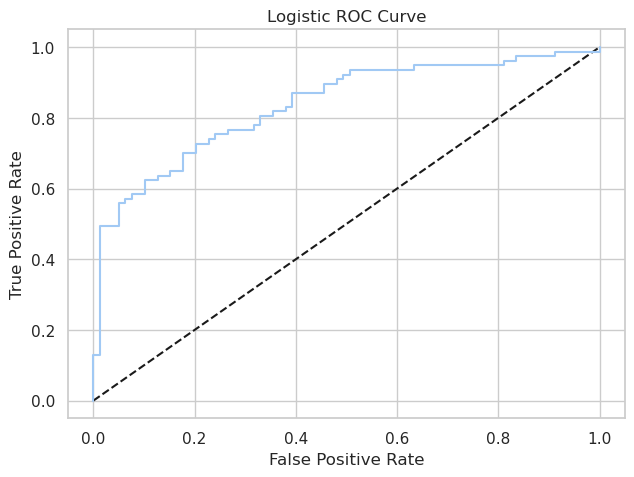

ROC AUC Score: 0.8358


In [36]:
model_pred = logistic_best.predict(X_test)
y_pred_prob = logistic_best.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, model_pred)


roc_auc = roc_auc_score(y_test, y_pred_prob)
roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
print(roc_auc_format)

### Decision Tree:

In [37]:
dt_base = DecisionTreeClassifier(random_state=21)
dt_base.fit(X_train, y_train)
path = dt_base.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
model_pred = dt_base.predict(X_train)

In [38]:
score = dt_base.score(X_train, y_train) * 100
print(f'{score:.2f}')

100.00


In [39]:
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')

100.00


In [40]:
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

100.00


In [41]:
model_pred = dt_base.predict(X_test)

In [42]:
score = dt_base.score(X_test, y_test) * 100
print(f'{score:.2f}')

75.64


In [43]:
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')

79.10


In [44]:
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

68.83


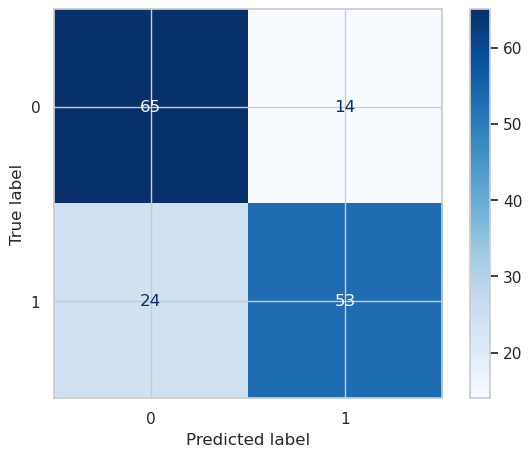

In [45]:
confmat = ConfusionMatrixDisplay.from_estimator(dt_base, X_test, y_test, cmap="Blues")

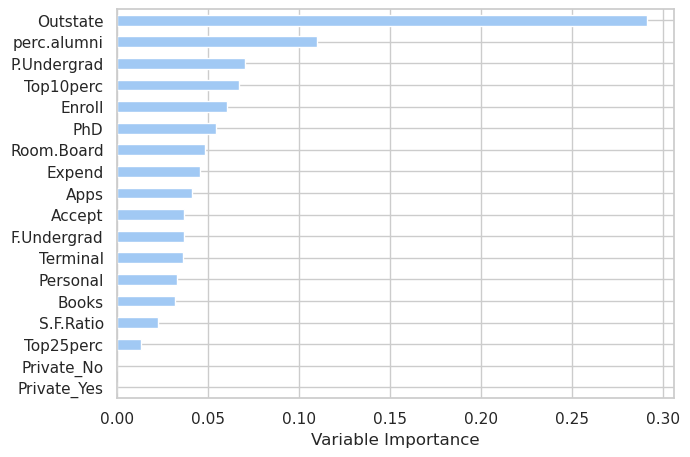

In [46]:
Importance = pd.DataFrame({'Importance':dt_base.feature_importances_}, index=X.columns)
Importance.sort_values('Importance', axis=0, ascending=True).plot(kind='barh',  color='b',linewidth = 1 )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None
plt.show()

In [47]:
dt_base2 = DecisionTreeClassifier(max_depth=5, random_state=21)
dt_base2.fit(X_train, y_train)
model_pred = dt_base2.predict(X_test)

In [48]:
score = dt_base2.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.00
77.14
70.13


In [49]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)

plot_tree(dt_base2, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.values);  

In [50]:
ccp_alphas

array([0.        , 0.00147611, 0.00148644, 0.00154029, 0.00154589,
       0.00158254, 0.00214707, 0.00214707, 0.00214707, 0.00241546,
       0.00257649, 0.00263505, 0.00268384, 0.00268384, 0.00268384,
       0.00268384, 0.00276052, 0.00276052, 0.00278527, 0.00283762,
       0.00288395, 0.00292783, 0.00309674, 0.00311126, 0.00338164,
       0.00356683, 0.00364853, 0.00396269, 0.00406352, 0.00415397,
       0.00425905, 0.00428021, 0.00429415, 0.00429415, 0.00438361,
       0.00442483, 0.00460087, 0.00461133, 0.0047566 , 0.00476829,
       0.0048647 , 0.00488843, 0.00554318, 0.00566851, 0.00581455,
       0.00585566, 0.00609304, 0.00679514, 0.00824088, 0.00827499,
       0.0132528 , 0.01392426, 0.01860402, 0.03537302, 0.12801018])

In [51]:
# Define parameter grid
param_grid = {
'criterion': ['gini', 'entropy', 'log_loss'],
'max_features': [None, 'sqrt', 'log2'],
'ccp_alpha': ccp_alphas
}
# Create a decision tree model
dt_opt = DecisionTreeClassifier(random_state=21)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=21)
# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=dt_opt, param_grid=param_grid, cv=cv, scoring='accuracy', n_jobs =-1)
grid_search.fit(X_train,y_train)

print("tuned hyperparameters: ",grid_search.best_params_)
print("accuracy: ",grid_search.best_score_)

tuned hyperparameters:  {'ccp_alpha': 0.018604016046471286, 'criterion': 'entropy', 'max_features': None}
accuracy:  0.7549155145929339


In [53]:
dt_best = DecisionTreeClassifier(random_state=21, ccp_alpha=0.018604016046471286, criterion='entropy', max_features=None)
dt_best.fit(X_train, y_train)
model_pred = dt_best.predict(X_train)

In [54]:
score = dt_best.score(X_train, y_train) * 100
print(f'{score:.2f}')
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

80.68
85.66
73.46


In [57]:
model_pred = dt_best.predict(X_test)
score = dt_best.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.64
81.97
64.94


In [58]:
print(classification_report(y_test, model_pred))

              precision    recall  f1-score   support

           0       0.72      0.86      0.78        79
           1       0.82      0.65      0.72        77

    accuracy                           0.76       156
   macro avg       0.77      0.76      0.75       156
weighted avg       0.77      0.76      0.75       156



Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

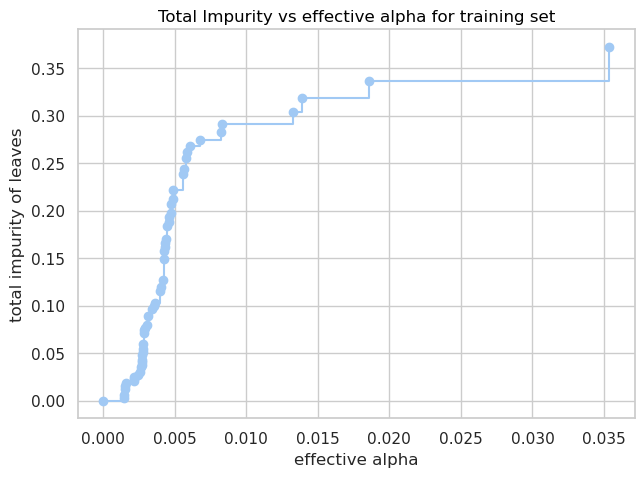

In [59]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [60]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)

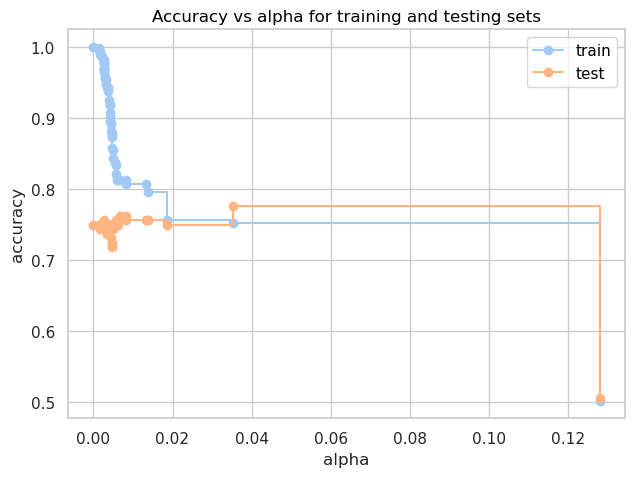

In [61]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [62]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)

plot_tree(dt_best, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.values);

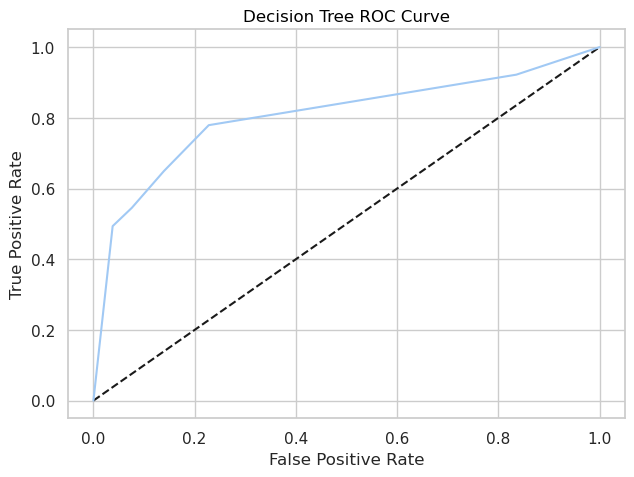

ROC AUC Score: 0.8052


In [63]:
y_pred_prob = dt_best.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, model_pred)


roc_auc = roc_auc_score(y_test, y_pred_prob)
roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
print(roc_auc_format)

# Random Forest Classification

In [64]:
# Define function to print classification metrics and train/test differences to help identify overfitting or underfitting  

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss

def print_classification_metrics_and_diff(model, X_train, y_train, X_test, y_test):
    
    datasets = [('Train', X_train, y_train), ('Test', X_test, y_test)]
    metrics_list = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC ROC', 'Log Loss']
    metrics_functions = {
        'Accuracy': accuracy_score,
        'Precision': precision_score,
        'Recall': recall_score,
        'F1': f1_score,
        'AUC ROC': roc_auc_score,
        'Log Loss': log_loss
    }
    results = {'Train': {}, 'Test': {}}

    print(f"Metrics for {model}:")
    
    for name, X, y in datasets:
        y_pred = model.predict(X)
        y_pred_proba = model.predict_proba(X)[:, 1] if 'predict_proba' in dir(model) else None
        for metric in metrics_list:
            if metric in ['AUC ROC', 'Log Loss'] and y_pred_proba is not None:
                score = metrics_functions[metric](y, y_pred_proba) if metric != 'Log Loss' else metrics_functions[metric](y, y_pred_proba, labels=np.unique(y))
            elif metric in ['Precision', 'Recall', 'F1']:
                score = metrics_functions[metric](y, y_pred, average='binary')
            else:
                score = metrics_functions[metric](y, y_pred)
            results[name][metric] = score
    
    print(f"\n{'Metric':<12} {'Train':<10} {'Test':<10}")
    print("-" * 32)
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        # Handle Log Loss differently
        if metric == 'Log Loss':
            print(f"{metric:<12} {train_score:.4f}       {test_score:.4f}")
        else:
            print(f"{metric:<12} {train_score*100:.2f}%     {test_score*100:.2f}%")
    
    print("\nDifferences (Train - Test):")
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        diff = (train_score - test_score) if metric == 'Log Loss' else (train_score - test_score) * 100
        direction = "increased" if diff < 0 else "decreased"

        if metric == 'Log Loss':
            print(f"{metric} {direction} by {abs(diff):.4f}")
        else:
            print(f"{metric} {direction} by {abs(diff):.2f}%")

# print_classification_metrics_and_diff(model)

In [65]:
from sklearn.ensemble import RandomForestClassifier 

rf_base = RandomForestClassifier(n_estimators=100, random_state = 21) #default model n_estimators=100
rf_base.fit(X_train, y_train)
model_rf_pred = rf_base.predict(X_test)

print_classification_metrics_and_diff(rf_base, X_train, y_train, X_test, y_test)

Metrics for RandomForestClassifier(random_state=21):

Metric       Train      Test      
--------------------------------
Accuracy     100.00%     76.92%
Precision    100.00%     79.71%
Recall       100.00%     71.43%
F1           100.00%     75.34%
AUC ROC      100.00%     83.45%
Log Loss     0.1326       0.5084

Differences (Train - Test):
Accuracy decreased by 23.08%
Precision decreased by 20.29%
Recall decreased by 28.57%
F1 decreased by 24.66%
AUC ROC decreased by 16.55%
Log Loss increased by 0.3758


In [66]:
# Pipeline with grid search will go here 

In [67]:
# Initialize rf classifier
rf_best = RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=4, random_state=21)
rf_best.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=4,
                       random_state=21)

In [68]:
print_classification_metrics_and_diff(rf_best, X_train, y_train, X_test, y_test)

Metrics for RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=4,
                       random_state=21):

Metric       Train      Test      
--------------------------------
Accuracy     94.04%     78.85%
Precision    94.74%     82.35%
Recall       93.20%     72.73%
F1           93.96%     77.24%
AUC ROC      98.96%     84.19%
Log Loss     0.2382       0.4826

Differences (Train - Test):
Accuracy decreased by 15.20%
Precision decreased by 12.38%
Recall decreased by 20.48%
F1 decreased by 16.72%
AUC ROC decreased by 14.77%
Log Loss increased by 0.2445


In [69]:
from sklearn.metrics import RocCurveDisplay
from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.model_selection import train_test_split # to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix, classification_report # to create a confusion matrix and classification report
from sklearn.metrics import ConfusionMatrixDisplay # to draw a confusion matrix
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss # to calculate the performance metrics
from sklearn.metrics import roc_curve, roc_auc_score # to calculate the performance metrics


Test-data classification report:
               precision    recall  f1-score   support

           0       0.76      0.85      0.80        79
           1       0.82      0.73      0.77        77

    accuracy                           0.79       156
   macro avg       0.79      0.79      0.79       156
weighted avg       0.79      0.79      0.79       156



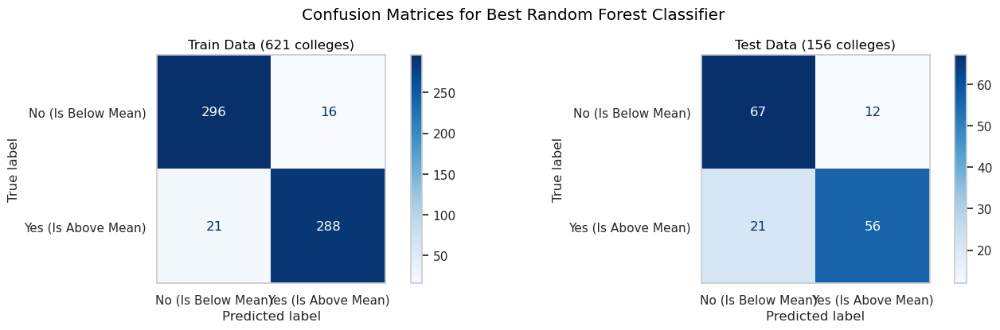

In [70]:

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

y_test_pred = rf_best.predict(X_test)  # Generate predictions on the testing data

print("\nTest-data classification report:\n", classification_report(y_test, y_test_pred))  # Print the classification report

# Produce confusion matrices for training and testing data
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
train_confmat = ConfusionMatrixDisplay.from_estimator(rf_best, X_train, y_train, cmap="Blues",
                                                      display_labels=['No (Is Below Mean)', 'Yes (Is Above Mean)'],
                                                      values_format='d', ax=ax[0])
ax[0].set_title(f"Train Data ({y_train.shape[0]} colleges)")
ax[0].grid(False)

test_confmat = ConfusionMatrixDisplay.from_estimator(rf_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['No (Is Below Mean)', 'Yes (Is Above Mean)'],
                                                     values_format='d', ax=ax[1])
ax[1].set_title(f"Test Data ({y_test.shape[0]} colleges)")
ax[1].grid(False)

plt.suptitle("Confusion Matrices for Best Random Forest Classifier", x=0.53, y=1.01)
plt.tight_layout(pad=0.5)
plt.show()

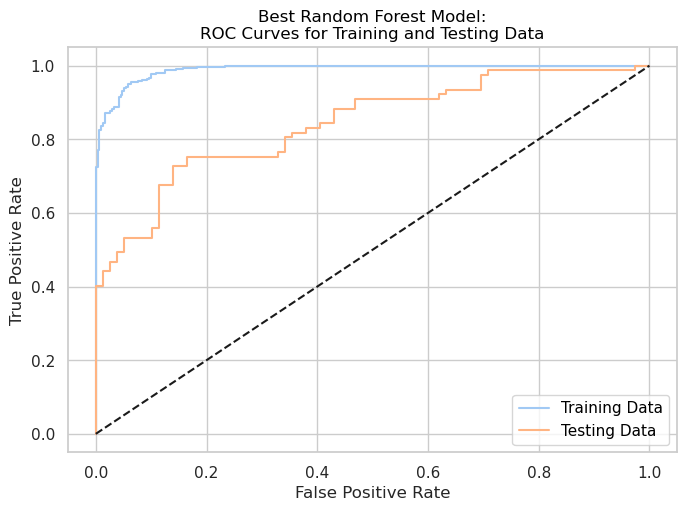

In [71]:
# Produce plot combining the ROC curves for model performance on training and testing data

f, ax = plt.subplots(figsize=(7, 5))
RocCurveDisplay.from_estimator(rf_best, X_train, y_train, label='Training Data', ax=ax) # training ROC curve
RocCurveDisplay.from_estimator(rf_best, X_test, y_test, label='Testing Data', ax=ax) # testing ROC curve
plt.plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Best Random Forest Model:\nROC Curves for Training and Testing Data')
plt.show()

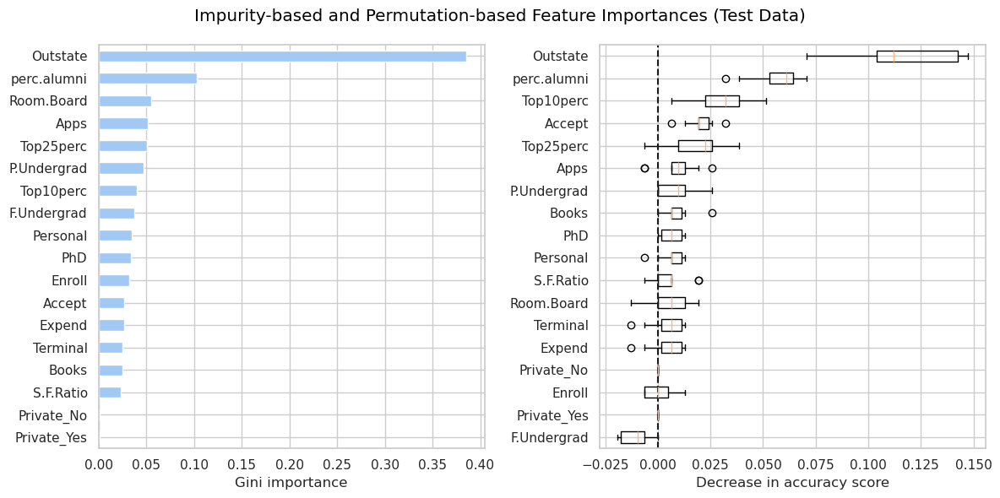

In [72]:
# Feature importance: side-by-side plot for impurity vs permutation

mdi_importances = pd.Series(rf_best.feature_importances_, index=X_test.columns)
tree_importance_sorted_idx = np.argsort(rf_best.feature_importances_)
tree_indices = np.arange(0, len(rf_best.feature_importances_)) + 0.5

from sklearn.inspection import permutation_importance

def plot_permutation_importance(clf, X, y, ax):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=42, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    ax.boxplot(
        result.importances[perm_sorted_idx].T,
        vert=False,
        labels=X.columns[perm_sorted_idx],
    )
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
mdi_importances.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(rf_best, X_test, y_test, ax2)
ax2.set_xlabel("Decrease in accuracy score")
fig.suptitle(
    "Impurity-based and Permutation-based Feature Importances (Test Data)"
)
_ = fig.tight_layout()

## Classification Model Summary

In [73]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss

def evaluate_classification_model(model, X_train, y_train, X_test, y_test):
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Probabilities for AUC and log loss
    y_train_proba = model.predict_proba(X_train)[:, 1]
    y_test_proba = model.predict_proba(X_test)[:, 1]
    
    # Compute metrics
    metrics = {
        'Train Accuracy': accuracy_score(y_train, y_train_pred),
        'Test Accuracy': accuracy_score(y_test, y_test_pred),
        'Train Precision': precision_score(y_train, y_train_pred, average='weighted'),
        'Test Precision': precision_score(y_test, y_test_pred, average='weighted'),
        'Train Recall': recall_score(y_train, y_train_pred, average='weighted'),
        'Test Recall': recall_score(y_test, y_test_pred, average='weighted'),
        'Train F1': f1_score(y_train, y_train_pred, average='weighted'),
        'Test F1': f1_score(y_test, y_test_pred, average='weighted'),
        'Train AUC ROC': roc_auc_score(y_train, y_train_proba, multi_class='ovr'),
        'Test AUC ROC': roc_auc_score(y_test, y_test_proba, multi_class='ovr')
    }
    
    # Add differences between train/test
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC ROC']:
        train_metric = metrics[f'Train {metric}']
        test_metric = metrics[f'Test {metric}']
        metrics[f'{metric} Diff'] = test_metric - train_metric
    
    return metrics

def classification_metrics_df(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        metrics = evaluate_classification_model(model, X_train, y_train, X_test, y_test)
        metrics_row = {'Model': name, **metrics}  
        results.append(metrics_row)
    
    metrics_df = pd.DataFrame(results)
    return metrics_df

models = {
    'Logistic Regression': rf_base,  # to be replaced
    'Decision Tree Classifier': rf_best,  # to be replace 
    'Random Forest Classifier': rf_best
}

metrics_df = classification_metrics_df(models, X_train, y_train, X_test, y_test)
metrics_df = metrics_df.set_index('Model')
metrics_df

,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1,Test F1,Train AUC ROC,Test AUC ROC,Accuracy Diff,Precision Diff,Recall Diff,F1 Diff,AUC ROC Diff
Model,,,,,,,,,,,,,,,
Logistic Regression,1.000000,0.769231,1.000000,0.771794,1.000000,0.769231,1.000000,0.768469,1.000000,0.834539,-0.230769,-0.228206,-0.230769,-0.231531,-0.165461
Decision Tree Classifier,0.940419,0.788462,0.940528,0.792048,0.940419,0.788462,0.940412,0.787597,0.989576,0.841854,-0.151957,-0.148480,-0.151957,-0.152816,-0.147721
Random Forest Classifier,0.940419,0.788462,0.940528,0.792048,0.940419,0.788462,0.940412,0.787597,0.989576,0.841854,-0.151957,-0.148480,-0.151957,-0.152816,-0.147721


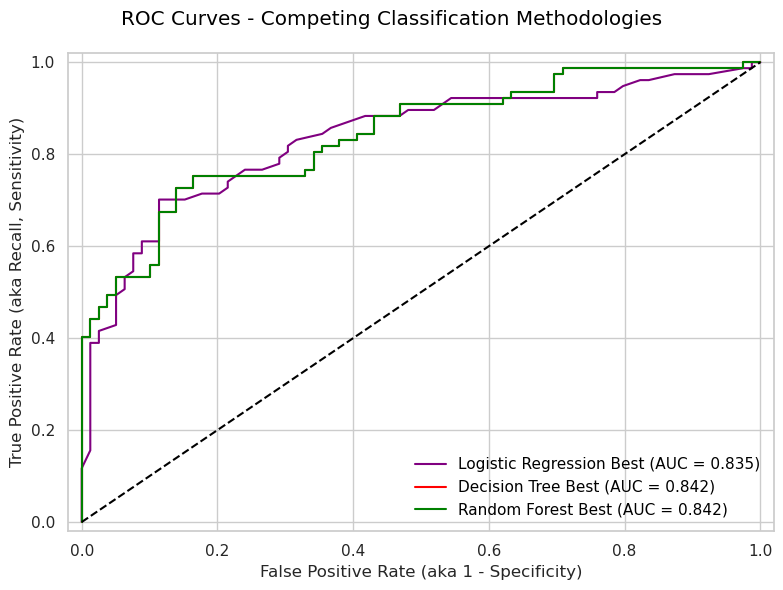

In [74]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_curve(model, X_test, y_test, model_name, color):
    proba = model.predict_proba(X_test)[:, 1]  # Get model probabilities
    fpr, tpr, _ = roc_curve(y_test, proba) # Calculate ROC curve points
    auc = roc_auc_score(y_test, proba) # Calculate AUC score
    plt.plot(fpr, tpr, color=color, label=f'{model_name} (AUC = {auc:.3f})')  # Plot the ROC curve

plt.figure(figsize=(8, 6))
plt.suptitle('ROC Curves - Competing Classification Methodologies')

plot_roc_curve(rf_base, X_test, y_test, 'Logistic Regression Best', 'purple') #replace
plot_roc_curve(rf_best, X_test, y_test, 'Decision Tree Best', 'red') #replace
plot_roc_curve(rf_best, X_test, y_test, 'Random Forest Best', 'green')

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate (aka 1 - Specificity)') 
plt.ylabel('True Positive Rate (aka Recall, Sensitivity)')  
plt.legend(loc="lower right", frameon=False)
plt.tight_layout()
plt.show()

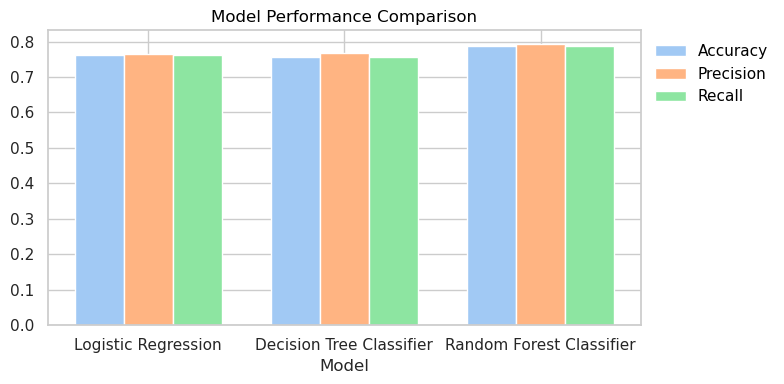

In [75]:
def plot_model_performance(models, X_train, y_train, X_test, y_test):
    model_names = list(models.keys())
    accuracies = []
    precisions = []
    recalls = []
    
    for model in models.values():
        metrics = evaluate_classification_model(model, X_train, y_train, X_test, y_test)
        accuracies.append(metrics['Test Accuracy'])
        precisions.append(metrics['Test Precision'])
        recalls.append(metrics['Test Recall'])
    
    index = np.arange(len(models))
    bar_width = 0.25

    f, ax = plt.subplots(figsize=(8,4))
    ax.bar(index, accuracies, bar_width, label='Accuracy')
    ax.bar(index + bar_width, precisions, bar_width, label='Precision')
    ax.bar(index + 2 * bar_width, recalls, bar_width, label='Recall')

    ax.set_xlabel('Model')
    ax.set_title('Model Performance Comparison')
    ax.set_xticks(index + bar_width)
    ax.set_xticklabels(model_names)
    ax.legend(bbox_to_anchor=(1,1), frameon=False)

    plt.tight_layout()
    plt.show()

models = {
    'Logistic Regression': logistic_best, #replace 
    'Decision Tree Classifier': dt_best,  #replace
    'Random Forest Classifier': rf_best  
}
plot_model_performance(models, X_train, y_train, X_test, y_test)

### Restore "Grad.Rate" column and resplit data:

In [76]:
df["Grad.Rate"] = savedGradRate

In [77]:
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Private_No,Private_Yes,Grad.Rate
0,0.497356,0.338022,0.077937,-0.818385,-0.391917,0.133151,-0.390102,-0.977306,0.062820,0.438299,0.245466,0.580284,0.694741,0.578203,-1.035512,-0.618530,1.662419,-1.662419,60
1,-0.165241,-0.038669,0.755791,-0.534402,-0.645386,0.665722,0.354167,-1.443110,-0.727444,-2.109046,1.266896,0.154546,-0.235790,0.780834,-1.199849,-0.718370,1.662419,-1.662419,56
2,1.002215,1.456326,1.896958,-0.080028,0.064326,1.648238,0.954764,-0.390194,0.311574,0.050132,0.810382,1.006021,1.027073,-0.814892,-1.364187,0.794973,1.662419,-1.662419,54
3,-0.660146,-0.694632,-0.707185,-0.136824,0.419182,-0.656938,-0.441918,-0.034489,0.597147,0.923508,-0.717946,-0.088732,-0.568123,-1.448117,0.525695,-0.374247,-0.601533,0.601533,59
4,-0.596337,-0.594371,-0.532587,-0.477605,-0.594692,-0.506591,-0.316303,-1.014670,-0.777734,0.316997,0.732515,0.458644,0.229475,0.122281,-1.035512,-0.334957,-0.601533,0.601533,15


In [78]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [79]:
sc = StandardScaler()

In [80]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

In [81]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [82]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

### Ridge Regression:

iteration 0.0001 done
iteration 0.0005 done
iteration 0.001 done
iteration 0.005 done
iteration 0.01 done
iteration 0.05 done
iteration 0.1 done
iteration 0.25 done
iteration 0.5 done
iteration 10 done
iteration 50 done
iteration 100 done
iteration 150 done
iteration 200 done
iteration 250 done
iteration 500 done


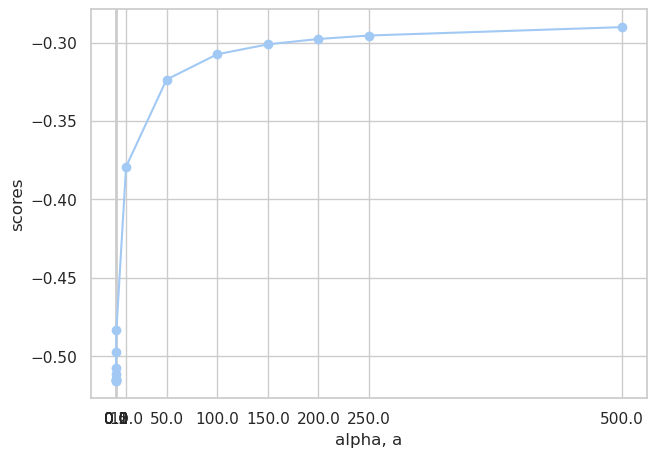

In [83]:
#Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 10, 50, 100, 150, 200, 250, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    scores.append(ridge.score(X_test, y_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.show()

iteration 10 done
iteration 50 done
iteration 100 done
iteration 125 done
iteration 150 done
iteration 175 done
iteration 200 done
iteration 225 done
iteration 250 done
iteration 275 done
iteration 500 done


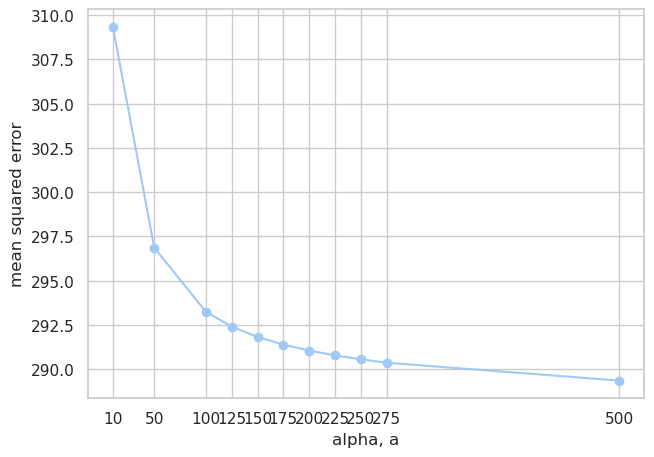

In [84]:
# On inspection: lambda range around 150 in alpha value.
alphas = [10, 50, 100, 125, 150, 175, 200, 225, 250, 275, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    pred_test=ridge.predict(X_test)
    scores.append(mean_squared_error(y_test, pred_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('mean squared error')
plt.xticks(alphas)
plt.show()

In [85]:
# Similar result in lower mean square error, thus grid search would focus alpha values of 50-250 for optimal lambda value
ridge_model = Ridge(fit_intercept=True, max_iter=5000)

# Define model evaluation method (K = 5, repeats = 5)
cv = RepeatedKFold(n_splits = 5, n_repeats = 5, random_state = 42)

# Defining grid
grid = dict()
grid['alpha'] = arange(50, 250, 1)

# Defining search (scoring = 'neg_mean_squared_error')
search = GridSearchCV(ridge_model, grid, scoring = 'neg_mean_squared_error', cv = cv, n_jobs=-1)
# Perform the search with testing data
result = search.fit(X_train, y_train)

In [86]:
print('Config: %s' % result.best_params_)

Config: {'alpha': 249}


In [87]:
ridge = Ridge(alpha = 92, fit_intercept=True)
ridge.fit(X_train, y_train)

# Create a dataframe with the coefficients
names = X.columns
ridge_coef = ridge.coef_
df_ridge = pd.DataFrame([ridge_coef])

df_ridge.columns = names
df_ridge = df_ridge.T
df_ridge=df_ridge.rename(columns = {0:'corr_ridge_coeff'})# corr_ridge_coeff is corresponding ridge coefficients of the variable
pd.options.display.float_format = '{:.3f}'.format
df_ridge

,corr_ridge_coeff
Apps,-0.077
Accept,-0.196
Enroll,-0.578
Top10perc,0.429
Top25perc,-0.041
F.Undergrad,-0.087
P.Undergrad,-0.356
Outstate,0.260
Room.Board,1.302
Books,0.242


In [88]:
# Ridge prediction using X_test and y_test

ridge_pred = ridge.predict(X_test)
y_hat_test = ridge_pred

# Predict: RMSE
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)

# Predict: R^2
test_r_squared = r2_score(y_test, y_hat_test)

# Predict: MAPE
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)

print(f'Test RMSE is:\t{test_rmse}')
print(f'Test R^2 is:\t{round(test_r_squared, 3)}')
print(f'Test MAPE is:\t{round(test_mape, 2)}')

Test RMSE is:	17.134728960235925
Test R^2 is:	-0.309
Test MAPE is:	0.3


In [89]:
df_ridge['Variable_Names'] = df_ridge.index

print(f"Graduation Rate = {ridge.intercept_:.2f} + ", end="")
for x in range (0, len(df_ridge['Variable_Names'])):
    print(f"({df_ridge['Variable_Names'][x]} * {df_ridge['corr_ridge_coeff'][x]:.2f})", end="")
    if (x + 1) < len(df_ridge['Variable_Names']):
        print(" + ", end="")

Graduation Rate = 67.74 + (Apps * -0.08) + (Accept * -0.20) + (Enroll * -0.58) + (Top10perc * 0.43) + (Top25perc * -0.04) + (F.Undergrad * -0.09) + (P.Undergrad * -0.36) + (Outstate * 0.26) + (Room.Board * 1.30) + (Books * 0.24) + (Personal * 0.43) + (PhD * 0.18) + (Terminal * 0.04) + (S.F.Ratio * -0.56) + (perc.alumni * -0.28) + (Expend * 0.61) + (Private_No * 1.17) + (Private_Yes * -1.17)

In [90]:
df_ridge['Variable_Names'] = df_ridge.index

print(f"Graduation Rate = {ridge.intercept_:.2f} + ", end="")
for x in range (0, len(df_ridge['Variable_Names'])):
    print(f"({df_ridge['Variable_Names'][x]} * {df_ridge['corr_ridge_coeff'][x]:.2f})", end="")
    if (x + 1) < len(df_ridge['Variable_Names']):
        print(" + ", end="")

Graduation Rate = 67.74 + (Apps * -0.08) + (Accept * -0.20) + (Enroll * -0.58) + (Top10perc * 0.43) + (Top25perc * -0.04) + (F.Undergrad * -0.09) + (P.Undergrad * -0.36) + (Outstate * 0.26) + (Room.Board * 1.30) + (Books * 0.24) + (Personal * 0.43) + (PhD * 0.18) + (Terminal * 0.04) + (S.F.Ratio * -0.56) + (perc.alumni * -0.28) + (Expend * 0.61) + (Private_No * 1.17) + (Private_Yes * -1.17)

In [91]:
# Create residual dataframe
ridge_y_residuals = pd.DataFrame(y_test.reset_index())
df_ridge_pred = pd.DataFrame(ridge_pred)
ridge_y_residuals = pd.concat([ridge_y_residuals, df_ridge_pred], axis = 1)
ridge_y_residuals = ridge_y_residuals.rename(columns = {0:'ridge_pred'})
ridge_y_residuals['ridge_resid'] = ridge_y_residuals['Grad.Rate'] - ridge_y_residuals['ridge_pred']
ridge_y_residuals.head()

,index,Grad.Rate,ridge_pred,ridge_resid
0,96,74,70.382,3.618
1,69,33,70.018,-37.018
2,82,49,69.264,-20.264
3,76,55,65.212,-10.212
4,114,87,66.162,20.838


In [92]:
ridge_y_residuals.rename(columns={'Grad.Rate': 'Actual Graduation Rate', 'ridge_pred': 'Predicted Graduation Rate'}, inplace=True)
ridge_y_residuals.head()

,index,Actual Graduation Rate,Predicted Graduation Rate,ridge_resid
0,96,74,70.382,3.618
1,69,33,70.018,-37.018
2,82,49,69.264,-20.264
3,76,55,65.212,-10.212
4,114,87,66.162,20.838


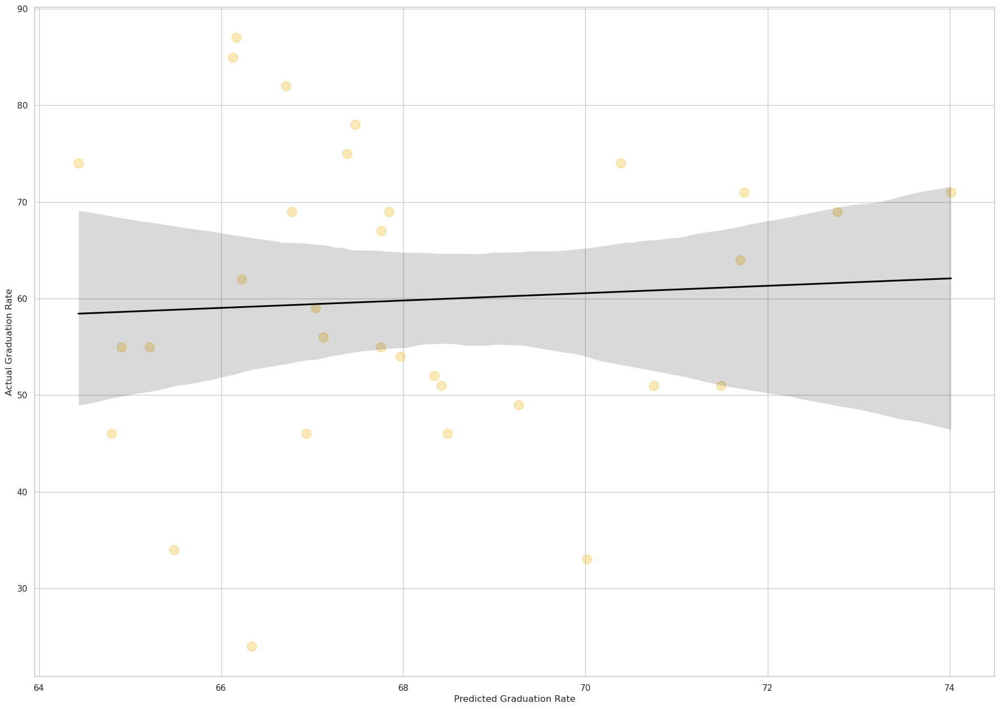

In [93]:
sns.set(style='whitegrid')
plt.figure(figsize=(20,15)) # changes area of scatterplot
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data = ridge_y_residuals,
            scatter_kws={"color":"#f2be2e","alpha":0.35,"s":150}, line_kws={'color': 'black'});

## LASSO Regression

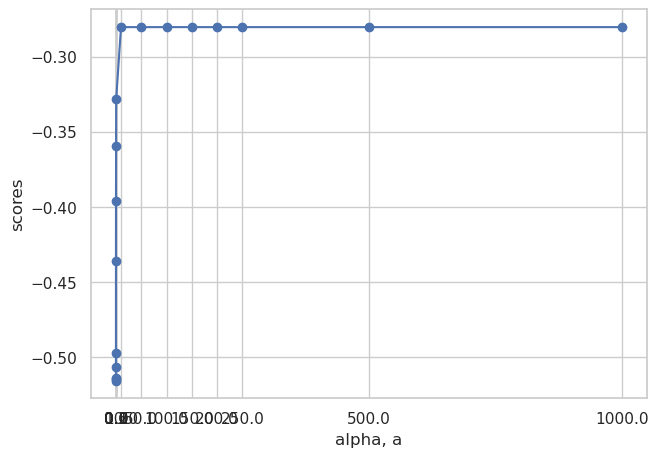

In [94]:
#Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 10, 50, 100, 150, 200, 250, 500, 1000]
scores = []

for a in alphas:
    lasso = Lasso(alpha = a, fit_intercept=True)
    lasso.fit(X_train, y_train)
    scores.append(lasso.score(X_test, y_test))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.show()

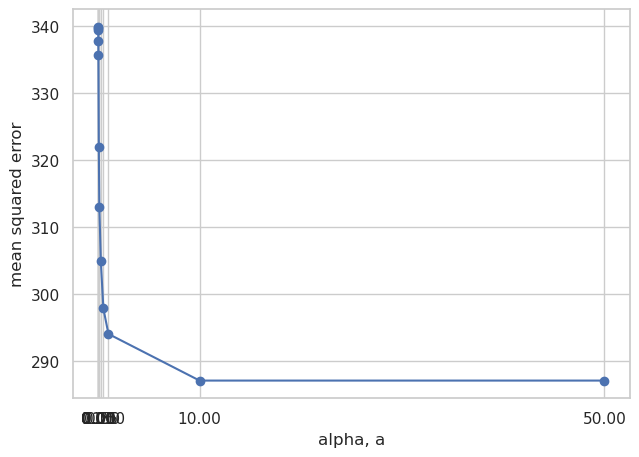

In [95]:
#What the heck is this graph
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 1, 10, 50]
scores = []

for a in alphas:
    lasso = Lasso(alpha = a, fit_intercept=True)
    lasso.fit(X_train, y_train)
    pred_test=lasso.predict(X_test)
    scores.append(mean_squared_error(y_test, pred_test))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('mean squared error')
plt.xticks(alphas)
plt.show()

In [96]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso

# First use grid search to find the best lambda

# define model
model = Lasso(fit_intercept=True, max_iter=5000)

# define model evaluation method
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 21)
# define grid
grid = dict()
grid['alpha'] = np.linspace(1, 10, 10)
# define search
search = GridSearchCV(model, grid, scoring = 'neg_mean_squared_error', cv = cv)
# perform the search
results = search.fit(X_train, y_train)
# Print the best parameter
bestAlpha =results.best_params_['alpha']
print("best alpha =", bestAlpha)


best alpha = 5.0


In [97]:
# Next make the model using the lambda printed above
model_lasso = Lasso(alpha=bestAlpha, fit_intercept=True, max_iter=5000)
model_lasso.fit(X_train, y_train)
model_lasso

Lasso(alpha=5.0, max_iter=5000)

In [98]:
# Now we take our model and run it against the test data
y_hat_test = model_lasso.predict(X_test)

#Lets calculate the MSE and RMSE for our test data
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test, y_hat_test)
test_r_squared = r2_score(y_test, y_hat_test)
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)
scores_lasso = {
    "RMSE" : test_rmse,
    "MAPE" : test_mape,
    "R2"   : test_r_squared
}

print(f'The test RMSE is: {test_rmse}')
print(f'The test MAPE is: {test_mape}')
print(f'The test Rsquared is: {test_r_squared}')


The test RMSE is: 16.94559797832086
The test MAPE is: 0.2989822538238833
The test Rsquared is: -0.28034908048027884


In [99]:
model_lasso.coef_

array([ 0.,  0., -0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,
       -0., -0.,  0.,  0., -0.])

In [100]:
# To identify the variables with the non zero regression coefficients, make a dataframe with the variables and their coefficients
names = X_train.columns
lasso_coef = model_lasso.coef_
df_lasso = pd.DataFrame([lasso_coef])
df_lasso = pd.DataFrame(lasso_coef)
names = pd.DataFrame(list(X_train.columns))
df_lasso  = pd.concat([names, df_lasso], axis = 1)
df_lasso .columns = ['Feature', 'lasso_coeff']
df_lasso  = df_lasso .sort_values(by='lasso_coeff', ascending = False)
df_lasso

,Feature,lasso_coeff
0,Apps,0.000
1,Accept,0.000
16,Private_No,0.000
15,Expend,0.000
14,perc.alumni,-0.000
13,S.F.Ratio,-0.000
12,Terminal,0.000
11,PhD,0.000
10,Personal,0.000
9,Books,0.000


# Random Forest Regression

In [101]:

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def print_regression_metrics_and_diff(model, X_train, y_train, X_test, y_test):
    datasets = [('Train', X_train, y_train), ('Test', X_test, y_test)]
    metrics_list = ['MAE', 'MSE', 'RMSE', 'R-squared']
    metrics_functions = {
        'MAE': mean_absolute_error,
        'MSE': mean_squared_error,
        'RMSE': lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)),
        'R-squared': r2_score
    }
    results = {'Train': {}, 'Test': {}}

    print(f"Metrics for {model}:")
    
    for name, X, y in datasets:
        y_pred = model.predict(X)
        for metric in metrics_list:
            score = metrics_functions[metric](y, y_pred)
            results[name][metric] = score
    
    print(f"\n{'Metric':<12} {'Train':<10} {'Test':<10}")
    print("-" * 32)
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        print(f"{metric:<12} {train_score:.4f}       {test_score:.4f}")
    
    print("\nDifferences (Train - Test):")
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        diff = train_score - test_score
        direction = "increased" if diff < 0 else "decreased"
        print(f"{metric} {direction} by {abs(diff):.4f}")

# print_regression_metrics_and_diff(model, X_train, y_train, X_test, y_test)

In [102]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

rfr_base = RandomForestRegressor(n_estimators=100, random_state=21)
rfr_base.fit(X_train, y_train)

RandomForestRegressor(random_state=21)

In [103]:
print_regression_metrics_and_diff(rfr_base, X_train, y_train, X_test, y_test)

Metrics for RandomForestRegressor(random_state=21):

Metric       Train      Test      
--------------------------------
MAE          5.5116       14.8531
MSE          50.9126       315.1067
RMSE         7.1353       17.7512
R-squared    0.8347       -0.4050

Differences (Train - Test):
MAE increased by 9.3415
MSE increased by 264.1941
RMSE increased by 10.6159
R-squared decreased by 1.2397


# Regression Model Comparison

In [104]:
# Define function to get the regression metrics into a table

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

def evaluate_regression_model(model, X_train, y_train, X_test, y_test):
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Compute the metrics
    metrics = {
        'Train RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        'Test RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        'Train R^2': r2_score(y_train, y_train_pred),
        'Test R^2': r2_score(y_test, y_test_pred),
        'Train MAPE': 100 * mean_absolute_percentage_error(y_train, y_train_pred),
        'Test MAPE': 100 * mean_absolute_percentage_error(y_test, y_test_pred)
    }
    
    return metrics

def evaluate_multiple_models(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        metrics = evaluate_regression_model(model, X_train, y_train, X_test, y_test)
        results.append({'Model': name, **metrics})
    
    metrics_df = pd.DataFrame(results)
    return metrics_df

models = {
    'Ridge': ridge, 
    'Lasso': model_lasso, 
    'Random Forest': rfr_base
}
metrics_df = evaluate_multiple_models(models, X_train, y_train, X_test, y_test)
metrics_df

,Model,Train RMSE,Test RMSE,Train R^2,Test R^2,Train MAPE,Test MAPE
0,Ridge,17.123,17.135,0.048,-0.309,25.782,30.101
1,Lasso,17.548,16.946,0.000,-0.280,26.669,29.898
2,Random Forest,7.135,17.751,0.835,-0.405,10.570,31.329


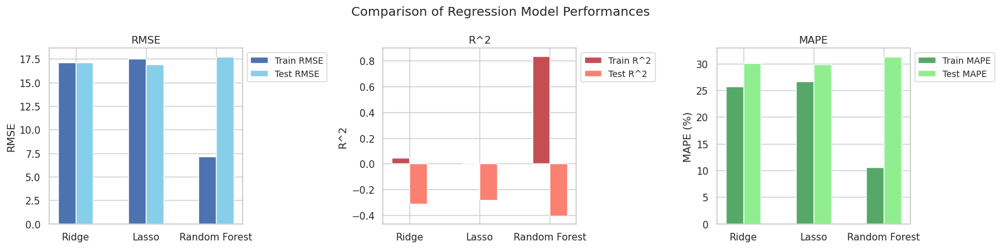

In [105]:
# Define function for bar plot of reg model performance metrics

def plot_regression_performance(models, X_train, y_train, X_test, y_test):
    model_names = list(models.keys())
    train_rmses = []
    test_rmses = []
    train_r_squareds = []
    test_r_squareds = []
    train_mapes = []
    test_mapes = []
    
    for model in models.values():
        metrics = evaluate_regression_model(model, X_train, y_train, X_test, y_test)
        train_rmses.append(metrics['Train RMSE'])
        test_rmses.append(metrics['Test RMSE'])
        train_r_squareds.append(metrics['Train R^2'])
        test_r_squareds.append(metrics['Test R^2'])
        train_mapes.append(metrics['Train MAPE'])
        test_mapes.append(metrics['Test MAPE'])
    
    index = np.arange(len(models))
    bar_width = 0.25 
    
    fig, axs = plt.subplots(1, 3, figsize=(16, 4), sharex=True)
    
    # RMSE Plot
    axs[0].bar(index - bar_width/2, train_rmses, bar_width, label='Train RMSE', color='b')
    axs[0].bar(index + bar_width/2, test_rmses, bar_width, label='Test RMSE', color='skyblue')
    axs[0].set_title('RMSE')
    axs[0].set_ylabel('RMSE')
    axs[0].legend()

    # R^2 Plot
    axs[1].bar(index - bar_width/2, train_r_squareds, bar_width, label='Train R^2', color='r')
    axs[1].bar(index + bar_width/2, test_r_squareds, bar_width, label='Test R^2', color='salmon')
    axs[1].set_title('R^2')
    axs[1].set_ylabel('R^2')
    axs[1].legend()

    # MAPE Plot
    axs[2].bar(index - bar_width/2, train_mapes, bar_width, label='Train MAPE', color='g')
    axs[2].bar(index + bar_width/2, test_mapes, bar_width, label='Test MAPE', color='lightgreen')
    axs[2].set_title('MAPE')
    axs[2].set_ylabel('MAPE (%)')
    axs[2].legend()

    for ax in axs:
        ax.set_xticks(index)
        ax.set_xticklabels(model_names)
        ax.legend(bbox_to_anchor=(1,1), fontsize='small')
    
    plt.suptitle("Comparison of Regression Model Performances")
    plt.tight_layout()
    plt.show()

plot_regression_performance(models, X_train, y_train, X_test, y_test)